In [ ]:
# ===============================
# 1. Install dependencies
# ===============================
!pip install -q transformers timm opencv-python matplotlib

In [2]:
from huggingface_hub import login
from google.colab import userdata
token = userdata.get('Nyi_token')
login(token=token)

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Hugging Face

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1OAwQPoxfnPPp90tlzRE1fTmfB377ksLA/Hugging Face


In [ ]:
from PIL import Image
import requests
import matplotlib.pyplot as plt
import torch
from torch import nn
from torchvision.models import resnet50
import torchvision.transforms as T

In [ ]:
class DETRdemo(nn.Module):
    """
    Demo DETR implementation.

    Demo implementation of DETR in minimal number of lines, with the
    following differences wrt DETR in the paper:
    * learned positional encoding (instead of sine)
    * positional encoding is passed at input (instead of attention)
    * fc bbox predictor (instead of MLP)
    The model achieves ~40 AP on COCO val5k and runs at ~28 FPS on Tesla V100.
    Only batch size 1 supported.
    """
    def __init__(self, num_classes, hidden_dim=256, nheads=8,
                 num_encoder_layers=6, num_decoder_layers=6):
        super().__init__()

        # create ResNet-50 backbone
        self.backbone = resnet50()
        del self.backbone.fc

        # create conversion layer
        self.conv = nn.Conv2d(2048, hidden_dim, 1)

        # create a default PyTorch transformer
        self.transformer = nn.Transformer(
            hidden_dim, nheads, num_encoder_layers, num_decoder_layers)

        # prediction heads, one extra class for predicting non-empty slots
        # note that in baseline DETR linear_bbox layer is 3-layer MLP
        self.linear_class = nn.Linear(hidden_dim, num_classes + 1)
        self.linear_bbox = nn.Linear(hidden_dim, 4)

        # output positional encodings (object queries)
        self.query_pos = nn.Parameter(torch.rand(100, hidden_dim))

        # spatial positional encodings
        # note that in baseline DETR we use sine positional encodings
        self.row_embed = nn.Parameter(torch.rand(50, hidden_dim // 2))
        self.col_embed = nn.Parameter(torch.rand(50, hidden_dim // 2))

    def forward(self, inputs):
        # propagate inputs through ResNet-50 up to avg-pool layer
        x = self.backbone.conv1(inputs)
        x = self.backbone.bn1(x)
        x = self.backbone.relu(x)
        x = self.backbone.maxpool(x)

        x = self.backbone.layer1(x)
        x = self.backbone.layer2(x)
        x = self.backbone.layer3(x)
        x = self.backbone.layer4(x)

        # convert from 2048 to 256 feature planes for the transformer
        h = self.conv(x)

        # construct positional encodings
        H, W = h.shape[-2:]
        pos = torch.cat([
            self.col_embed[:W].unsqueeze(0).repeat(H, 1, 1),
            self.row_embed[:H].unsqueeze(1).repeat(1, W, 1),
        ], dim=-1).flatten(0, 1).unsqueeze(1)

        # propagate through the transformer
        h = self.transformer(pos + 0.1 * h.flatten(2).permute(2, 0, 1),
                             self.query_pos.unsqueeze(1)).transpose(0, 1)

        # finally project transformer outputs to class labels and bounding boxes
        return {'pred_logits': self.linear_class(h),
                'pred_boxes': self.linear_bbox(h).sigmoid()}

In [ ]:
detr = DETRdemo(num_classes=91)
state_dict = torch.hub.load_state_dict_from_url(
    url='https://dl.fbaipublicfiles.com/detr/detr_demo-da2a99e9.pth',
    map_location='cpu', check_hash=True)
detr.load_state_dict(state_dict)
detr.eval();

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/transformer.py:385: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(
Downloading: "https://dl.fbaipublicfiles.com/detr/detr_demo-da2a99e9.pth" to /root/.cache/torch/hub/checkpoints/detr_demo-da2a99e9.pth
100%|██████████| 79.3M/79.3M [00:04<00:00, 18.4MB/s]


In [ ]:
# COCO classes
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

In [ ]:
# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [ ]:
def detect(im, model, transform):
    # mean-std normalize the input image (batch-size: 1)
    img = transform(im).unsqueeze(0)

    # demo model only support by default images with aspect ratio between 0.5 and 2
    # if you want to use images with an aspect ratio outside this range
    # rescale your image so that the maximum size is at most 1333 for best results
    assert img.shape[-2] <= 1600 and img.shape[-1] <= 1600, 'demo model only supports images up to 1600 pixels on each side'

    # propagate through the model
    outputs = model(img)

    # keep only predictions with 0.7+ confidence
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > 0.7

    # convert boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
    return probas[keep], bboxes_scaled

In [ ]:
image_path = "datasets/3d_test/truck.jpg"
image = Image.open(image_path).convert("RGB")

scores, boxes = detect(image, detr, transform)

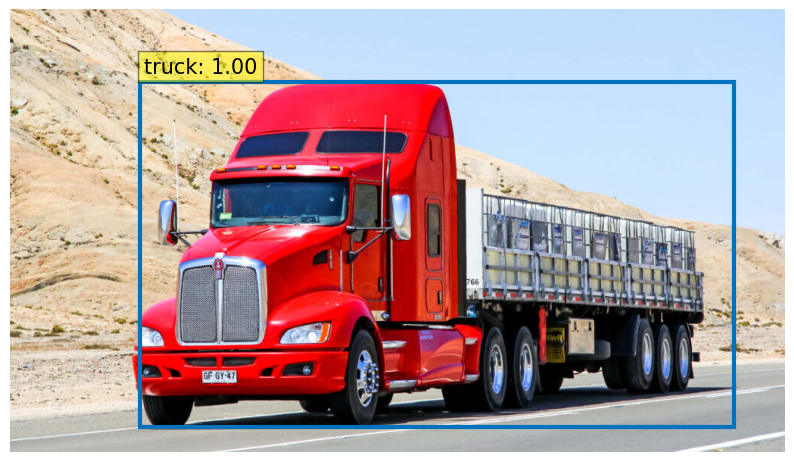

In [ ]:
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(10,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin+ 5, ymin- 12, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

plot_results(image, scores, boxes)

In [4]:
import torch
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.ops import nms
from transformers import pipeline
from transformers import DetrImageProcessor, DetrForObjectDetection

In [5]:
def project_points(points_3d, fx, fy, cx, cy):
    """Project 3D points into 2D image plane."""
    points_2d = []
    for X, Y, Z in points_3d:
        if Z <= 0:
            points_2d.append((None, None))
        else:
            x = int((X * fx) / Z + cx)
            y = int((Y * fy) / Z + cy)
            points_2d.append((x, y))
    return points_2d

def draw_cube(img, box_3d_2d, color=(0,255,0), thickness=2):
    """Draw cube given its projected 2D corner points."""
    # Top face
    for i in range(4):
        cv2.line(img, box_3d_2d[i], box_3d_2d[(i+1)%4], color, thickness, lineType=cv2.LINE_AA)
    # Bottom face
    for i in range(4, 8):
        cv2.line(img, box_3d_2d[i], box_3d_2d[4 + (i+1)%4], color, thickness, lineType=cv2.LINE_AA)
    # Vertical edges
    for i in range(4):
        cv2.line(img, box_3d_2d[i], box_3d_2d[i+4], color, thickness, lineType=cv2.LINE_AA)
    return img

def draw_slash_hatch_slanted(img, quad_pts, color=(0,255,255), spacing=10, thickness=1, direction=1, alpha=0.5):
    """
    Draw slash hatch lines inside a quad with optional transparency.
    """
    overlay = img.copy()  # temporary layer for transparency
    quad_pts = np.array(quad_pts, dtype=np.int32)
    x, y, w, h = cv2.boundingRect(quad_pts)

    # Determine diagonal vector for slash direction
    if direction == 1:
        dir_vec = np.array([1, -1], dtype=np.float32)  # /
    else:
        dir_vec = np.array([1, 1], dtype=np.float32)   # \

    dir_vec /= np.linalg.norm(dir_vec)  # normalize
    perp_vec = np.array([-dir_vec[1], dir_vec[0]], dtype=np.float32)

    num_lines = int((w + h) / spacing) + 2
    center = np.array([x + w/2, y + h/2])

    for i in range(-num_lines, num_lines):
        offset = perp_vec * (i * spacing)
        p1 = center + offset - dir_vec * max(w, h)
        p2 = center + offset + dir_vec * max(w, h)

        line_pts = np.linspace(p1, p2, 100)
        inside = [tuple(pt.astype(int)) for pt in line_pts if cv2.pointPolygonTest(quad_pts, pt, False) >= 0]
        if len(inside) >= 2:
            for a, b in zip(inside[:-1], inside[1:]):
                cv2.line(overlay, a, b, color, thickness, lineType=cv2.LINE_AA)

    # Blend overlay with original image
    cv2.addWeighted(overlay, alpha, img, 1 - alpha, 0, img)
    return img

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

image_path = "datasets/3d_test/truck.jpg"
image = Image.open(image_path).convert("RGB")

coco_image_processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
coco_model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50", device_map=device)

inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = coco_model(**inputs)

results = coco_image_processor.post_process_object_detection(
    outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.8
)
result = results[0]  # take first image results
print(result)

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


{'scores': tensor([0.9989], device='cuda:0'), 'labels': tensor([8], device='cuda:0'), 'boxes': tensor([[162.4960,  91.6478, 917.5609, 552.7134]], device='cuda:0')}


In [ ]:
h, w = image.height, image.width

# Camera intrinsics (simple guess)
fx = fy = w
cx, cy = w // 2, h // 2

In [ ]:
depth_pipe = pipeline(task="depth-estimation", model="depth-anything/Depth-Anything-V2-Small-hf")

Device set to use cuda:0


In [ ]:
depth_out = depth_pipe(image_path)
depth_map = np.array(depth_out["depth"], dtype=np.float32)
depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

# Resize to match original image size for bbox indexing
depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)
print(depth_map)

[[0.1882353  0.18431373 0.18431373 ... 0.09411765 0.09411765 0.09411765]
 [0.1882353  0.18431373 0.18431373 ... 0.09411765 0.09411765 0.09411765]
 [0.1882353  0.1882353  0.1882353  ... 0.09411765 0.09411765 0.09411765]
 ...
 [0.93333334 0.93333334 0.93333334 ... 0.9764706  0.9764706  0.9764706 ]
 [0.9372549  0.9372549  0.9372549  ... 0.9843137  0.9843137  0.98039216]
 [0.9254902  0.9372549  0.93333334 ... 0.9882353  0.99215686 0.9882353 ]]


Processing box (162, 91, 917, 552), depth_patch shape (461, 755)


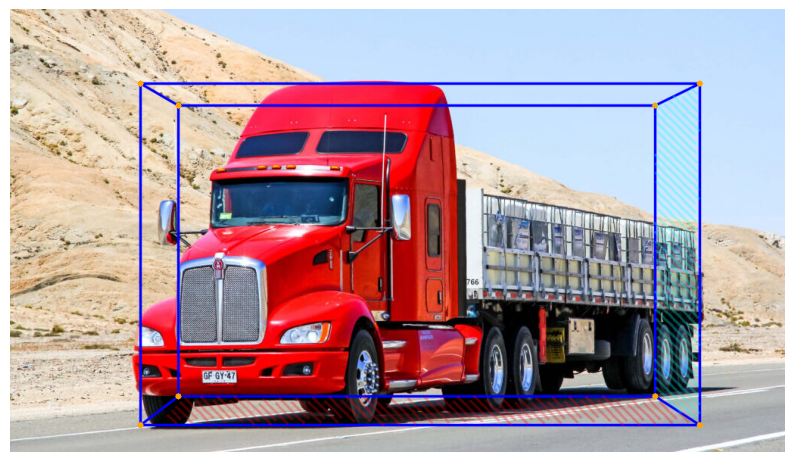

In [ ]:
output_img = image.copy()
output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)

for box in result['boxes'].cpu().numpy():
    # Clamp and convert bbox coords
    x1 = max(0, min(w - 1, int(box[0])))
    y1 = max(0, min(h - 1, int(box[1])))
    x2 = max(0, min(w, int(box[2])))
    y2 = max(0, min(h, int(box[3])))

    # Skip invalid boxes
    if x2 <= x1 or y2 <= y1:
        print(f"Skipping invalid box {(x1, y1, x2, y2)}")
        continue

    depth_patch = depth_map[y1:y2, x1:x2]

    if depth_patch.size == 0:
        print(f"Empty depth patch for box {(x1, y1, x2, y2)}")
        continue

    # Debug prints (optional, remove if too verbose)
    print(f"Processing box {(x1, y1, x2, y2)}, depth_patch shape {depth_patch.shape}")

    # Depth at object center (median)
    obj_depth = np.median(depth_patch) + 1e-6  # avoid div by zero

    # Width & height from bbox pixels -> meters
    box_width = (x2 - x1) / fx * obj_depth
    box_height = (y2 - y1) / fy * obj_depth

    # Depth from min/max inside bbox (depth variation)
    margin = 0.1  # adjust this based on depth scale

    mask = (depth_patch > obj_depth - margin) & (depth_patch < obj_depth + margin)
    if np.sum(mask) > 0:
        filtered_depths = depth_patch[mask]
        min_d = np.percentile(filtered_depths, 5)
        max_d = np.percentile(filtered_depths, 95)
        box_depth = max_d - min_d
        if box_depth < 1e-6:
            box_depth = box_width * 0.5
    else:
        box_depth = box_width * 0.5

    # After computing box_width, box_height, box_depth
    scale_xy = 0.9  # tweak as needed
    scale_z = 0.6 # tweak as needed

    box_width *= scale_xy
    box_height *= scale_xy
    box_depth *= scale_z

    # 3D cube corners (centered at bbox center)
    center_x = ((x1 + x2) / 2 - cx) / fx * obj_depth
    center_y = ((y1 + y2) / 2 - cy) / fy * obj_depth

    min_allowed_depth = 0.1  # meters

    corners_3d = []
    for dz in [-box_depth/2, box_depth/2]:
        for dy in [-box_height/2, box_height/2]:
            for dx in [-box_width/2, box_width/2]:
                Z = obj_depth + dz
                if Z < min_allowed_depth:
                    Z = min_allowed_depth
                corners_3d.append((center_x + dx, center_y + dy, Z))

    # Order corners: top 4, bottom 4
    ordered = [corners_3d[i] for i in [0,1,3,2,4,5,7,6]]

    # Project 3D points to 2D
    pts_2d = project_points(ordered, fx, fy, cx, cy)
    if any(p[0] is None for p in pts_2d):
        print(f"Skipping box due to invalid projection points for box {(x1, y1, x2, y2)}")
        continue

    # Draw the cube
    output_img = draw_cube(output_img, pts_2d, color=(255, 0, 0), thickness=2)

    # Draw corner points (red dots)
    for (x, y) in pts_2d:
        if x is not None and y is not None:
            cv2.circle(output_img, (x, y), 4, (0, 165, 255), -1)

    top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
    bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
    side_face_pts = [pts_2d[i] for i in [5,1,2,6]]

    #output_img = draw_slash_hatch_slanted(output_img, top_face_pts, color=(0,255,255), spacing=8, thickness=2, direction=1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, bottom_face_pts, color=(0,0,255), spacing=8, thickness=2, direction=-1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, side_face_pts, color=(255,255,0), spacing=8, thickness=2, direction=-1, alpha=0.3)

# ===============================
# 8. Show result
# ===============================
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)) # Convert back to RGB for displaying with matplotlib
plt.axis("off")
plt.show()

In [7]:
device = "cuda" if torch.cuda.is_available() else "cpu"

coco_image_processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
coco_model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50", device_map=device)

depth_pipe = pipeline(task="depth-estimation", model="depth-anything/Depth-Anything-V2-Small-hf")

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use cuda:0


Processing box (162, 91, 917, 552), depth_patch shape (461, 755)


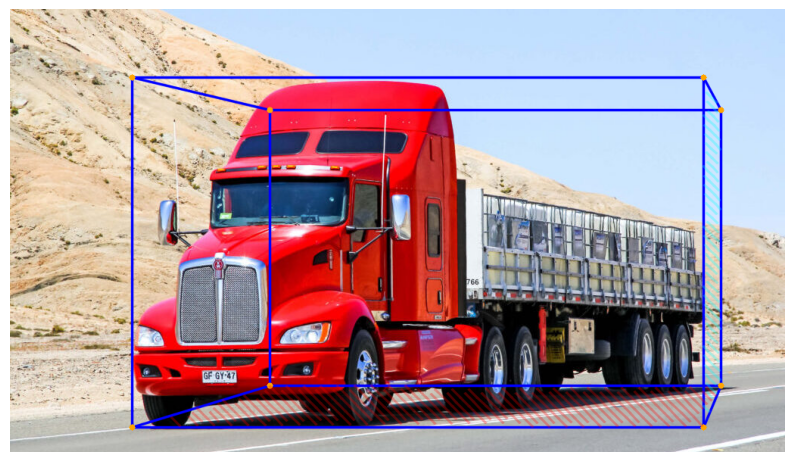

In [ ]:
image_path = "datasets/3d_test/truck.jpg"
image = Image.open(image_path).convert("RGB")

inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = coco_model(**inputs)

results = coco_image_processor.post_process_object_detection(
    outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.9
)
result = results[0]  # take first image results

h, w = image.height, image.width

# Camera intrinsics (simple guess)
fx = fy = w
cx, cy = w // 2, h // 2

depth_out = depth_pipe(image_path)
depth_map = np.array(depth_out["depth"], dtype=np.float32)
depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

# Resize to match original image size for bbox indexing
depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)

output_img = image.copy()
output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)

for box in result['boxes'].cpu().numpy():
    # Clamp and convert bbox coords
    x1 = max(0, min(w - 1, int(box[0])))
    y1 = max(0, min(h - 1, int(box[1])))
    x2 = max(0, min(w, int(box[2])))
    y2 = max(0, min(h, int(box[3])))

    # Skip invalid boxes
    if x2 <= x1 or y2 <= y1:
        print(f"Skipping invalid box {(x1, y1, x2, y2)}")
        continue

    depth_patch = depth_map[y1:y2, x1:x2]

    if depth_patch.size == 0:
        print(f"Empty depth patch for box {(x1, y1, x2, y2)}")
        continue

    # Debug prints (optional, remove if too verbose)
    print(f"Processing box {(x1, y1, x2, y2)}, depth_patch shape {depth_patch.shape}")

    # Depth at object center (median)
    obj_depth = np.median(depth_patch) + 1e-6  # avoid div by zero

    # Width & height from bbox pixels -> meters
    box_width = (x2 - x1) / fx * obj_depth
    box_height = (y2 - y1) / fy * obj_depth

    # Depth from min/max inside bbox (depth variation)
    margin = 0.1  # adjust this based on depth scale

    mask = (depth_patch > obj_depth - margin) & (depth_patch < obj_depth + margin)
    if np.sum(mask) > 0:
        filtered_depths = depth_patch[mask]
        min_d = np.percentile(filtered_depths, 5)
        max_d = np.percentile(filtered_depths, 95)
        box_depth = max_d - min_d
        if box_depth < 1e-6:
            box_depth = box_width * 0.5
    else:
        box_depth = box_width * 0.5

    # After computing box_width, box_height, box_depth
    scale_xy = 1  # tweak as needed
    scale_z = 1 # tweak as needed

    box_width *= scale_xy
    box_height *= scale_xy
    box_depth *= scale_z

    # 3D cube corners (centered at bbox center)
    center_x = ((x1 + x2) / 2 - cx) / fx * obj_depth
    center_y = ((y1 + y2) / 2 - cy) / fy * obj_depth

    min_allowed_depth = 0.1  # meters

    corners_3d = []
    # for dz in [-box_depth/2, box_depth/2]:
    #     for dy in [-box_height/2, box_height/2]:
    #         for dx in [-box_width/2, box_width/2]:
    #             Z = obj_depth + dz
    #             if Z < min_allowed_depth:
    #                 Z = min_allowed_depth
    #             corners_3d.append((center_x + dx, center_y + dy, Z))

    # --- front pixel corners (TL, TR, BR, BL) ---
    u_f = np.array([x1, x2, x2, x1], dtype=np.float32)
    v_f = np.array([y1, y1, y2, y2], dtype=np.float32)
    Zf = float(obj_depth)

    # Convert front pixel corners -> camera coords
    Xf = ((u_f - cx) / fx) * Zf
    Yf = ((v_f - cy) / fy) * Zf
    front_corners = [(float(Xf[i]), float(Yf[i]), Zf) for i in range(4)]

    # --- back face: shift in 3D space, not in pixel space ---
    # Move along +X and +Z for perspective depth
    back_shift_x = box_depth * 0.5    # how much to move right
    back_shift_z = box_depth          # how much to move back

    Xb = Xf + back_shift_x
    Yb = Yf.copy()
    Zb = Zf + back_shift_z
    back_corners = [(float(Xb[i]), float(Yb[i]), float(Zb)) for i in range(4)]

    # --- assemble and order corners ---
    corners_3d = front_corners + back_corners

    # Order corners: top 4, bottom 4
    ordered = [corners_3d[i] for i in [0,1,2,3,4,5,6,7]]

    # Project 3D points to 2D
    pts_2d = project_points(ordered, fx, fy, cx, cy)
    if any(p[0] is None for p in pts_2d):
        print(f"Skipping box due to invalid projection points for box {(x1, y1, x2, y2)}")
        continue

    # Draw the cube
    output_img = draw_cube(output_img, pts_2d, color=(255, 0, 0), thickness=2)

    # Draw corner points (red dots)
    for (x, y) in pts_2d:
        if x is not None and y is not None:
            cv2.circle(output_img, (x, y), 4, (0, 165, 255), -1)

    top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
    bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
    side_face_pts = [pts_2d[i] for i in [5,1,2,6]]

    #output_img = draw_slash_hatch_slanted(output_img, top_face_pts, color=(0,255,255), spacing=8, thickness=2, direction=1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, bottom_face_pts, color=(0,0,255), spacing=8, thickness=2, direction=-1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, side_face_pts, color=(255,255,0), spacing=8, thickness=2, direction=-1, alpha=0.3)

# ===============================
# 8. Show result
# ===============================
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)) # Convert back to RGB for displaying with matplotlib
plt.axis("off")
plt.show()

In [8]:
def depth_to_heatmap(depth_map_norm, colormap=cv2.COLORMAP_JET):
    """
    Convert a normalized depth map (0-1 float) to a colorful heatmap image (BGR uint8).

    Args:
        depth_map_norm (np.ndarray): Normalized depth map with values in [0, 1].
        colormap (int): OpenCV colormap type. Default is COLORMAP_JET.

    Returns:
        heatmap_bgr (np.ndarray): Color heatmap image in BGR uint8 format.
    """
    # Clip and scale depth to 0-255 uint8
    depth_uint8 = np.clip(depth_map_norm * 255, 0, 255).astype(np.uint8)

    # Apply colormap (e.g., JET)
    heatmap = cv2.applyColorMap(depth_uint8, colormap)

    return heatmap

Processing box (65, 69, 744, 455), depth_patch shape (386, 679)


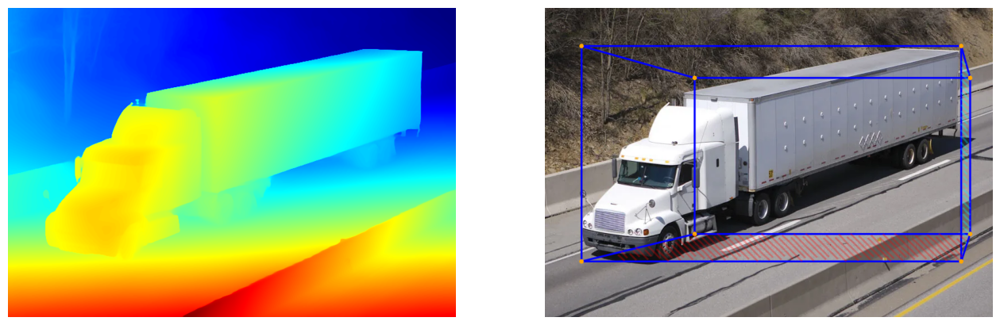

In [ ]:
image_path = "datasets/3d_tests/truck-white.jpg"
image = Image.open(image_path).convert("RGB")

inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = coco_model(**inputs)

results = coco_image_processor.post_process_object_detection(
    outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.9
)
result = results[0]  # take first image results

h, w = image.height, image.width

# Camera intrinsics (simple guess)
fx = fy = w
cx, cy = w // 2, h // 2

depth_out = depth_pipe(image_path)
depth_map = np.array(depth_out["depth"], dtype=np.float32)
depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

# Resize to match original image size for bbox indexing
depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)

output_img = image.copy()
output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)

img_depth = depth_to_heatmap(depth_map, colormap=cv2.COLORMAP_JET)

for box in result['boxes'].cpu().numpy():
    # Clamp and convert bbox coords
    x1 = max(0, min(w - 1, int(box[0])))
    y1 = max(0, min(h - 1, int(box[1])))
    x2 = max(0, min(w, int(box[2])))
    y2 = max(0, min(h, int(box[3])))

    # Skip invalid boxes
    if x2 <= x1 or y2 <= y1:
        print(f"Skipping invalid box {(x1, y1, x2, y2)}")
        continue

    depth_patch = depth_map[y1:y2, x1:x2]

    if depth_patch.size == 0:
        print(f"Empty depth patch for box {(x1, y1, x2, y2)}")
        continue

    # Debug prints (optional, remove if too verbose)
    print(f"Processing box {(x1, y1, x2, y2)}, depth_patch shape {depth_patch.shape}")

    # Depth at object center (median)
    obj_depth = np.median(depth_patch) + 1e-6  # avoid div by zero

    # Width & height from bbox pixels -> meters
    box_width = (x2 - x1) / fx * obj_depth
    box_height = (y2 - y1) / fy * obj_depth

    # Depth from min/max inside bbox (depth variation)
    margin = 0.1  # adjust this based on depth scale

    mask = (depth_patch > obj_depth - margin) & (depth_patch < obj_depth + margin)
    if np.sum(mask) > 0:
        filtered_depths = depth_patch[mask]
        min_d = np.percentile(filtered_depths, 5)
        max_d = np.percentile(filtered_depths, 95)
        box_depth = max_d - min_d
        if box_depth < 1e-6:
            box_depth = box_width * 0.5
    else:
        box_depth = box_width * 0.5

    # After computing box_width, box_height, box_depth
    scale_xy = 1  # tweak as needed
    scale_z = 1 # tweak as needed

    box_width *= scale_xy
    box_height *= scale_xy
    box_depth *= scale_z

    # 3D cube corners (centered at bbox center)
    center_x = ((x1 + x2) / 2 - cx) / fx * obj_depth
    center_y = ((y1 + y2) / 2 - cy) / fy * obj_depth

    min_allowed_depth = 0.1  # meters

    corners_3d = []
    # for dz in [-box_depth/2, box_depth/2]:
    #     for dy in [-box_height/2, box_height/2]:
    #         for dx in [-box_width/2, box_width/2]:
    #             Z = obj_depth + dz
    #             if Z < min_allowed_depth:
    #                 Z = min_allowed_depth
    #             corners_3d.append((center_x + dx, center_y + dy, Z))

    # --- front pixel corners (TL, TR, BR, BL) ---
    u_f = np.array([x1, x2, x2, x1], dtype=np.float32)
    v_f = np.array([y1, y1, y2, y2], dtype=np.float32)
    Zf = float(obj_depth)

    # Convert front pixel corners -> camera coords
    Xf = ((u_f - cx) / fx) * Zf
    Yf = ((v_f - cy) / fy) * Zf
    front_corners = [(float(Xf[i]), float(Yf[i]), Zf) for i in range(4)]

    # --- back face: shift in 3D space, not in pixel space ---
    # Move along +X and +Z for perspective depth
    back_shift_x = box_depth * 0.5    # how much to move right
    back_shift_z = box_depth          # how much to move back

    Xb = Xf + back_shift_x
    Yb = Yf.copy()
    Zb = Zf + back_shift_z
    back_corners = [(float(Xb[i]), float(Yb[i]), float(Zb)) for i in range(4)]

    # --- assemble and order corners ---
    corners_3d = front_corners + back_corners

    # Order corners: top 4, bottom 4
    ordered = [corners_3d[i] for i in [0,1,2,3,4,5,6,7]]

    # Project 3D points to 2D
    pts_2d = project_points(ordered, fx, fy, cx, cy)
    if any(p[0] is None for p in pts_2d):
        print(f"Skipping box due to invalid projection points for box {(x1, y1, x2, y2)}")
        continue

    # Draw the cube
    output_img = draw_cube(output_img, pts_2d, color=(255, 0, 0), thickness=2)

    # Draw corner points (red dots)
    for (x, y) in pts_2d:
        if x is not None and y is not None:
            cv2.circle(output_img, (x, y), 4, (0, 165, 255), -1)

    top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
    bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
    side_face_pts = [pts_2d[i] for i in [5,1,2,6]]

    #output_img = draw_slash_hatch_slanted(output_img, top_face_pts, color=(0,255,255), spacing=8, thickness=2, direction=1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, bottom_face_pts, color=(0,0,255), spacing=8, thickness=2, direction=-1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, side_face_pts, color=(255,255,0), spacing=8, thickness=2, direction=-1, alpha=0.3)

    # Convert to RGB for matplotlib
    img_depth = cv2.cvtColor(img_depth, cv2.COLOR_BGR2RGB)
    output_img = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)

# Plot side-by-side
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(img_depth)

plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(output_img)

plt.show()

In [ ]:
!git clone https://github.com/ChaoningZhang/MobileSAM.git
%cd MobileSAM
!pip install timm
%cd ..

In [10]:
import sys
sys.path.append("/content/gdrive/MyDrive/Hugging Face/MobileSAM")
from mobile_sam import sam_model_registry, SamPredictor

device = "cuda" if torch.cuda.is_available() else "cpu"
model_type = "vit_t"  # MobileSAM uses tiny ViT
sam_checkpoint = "mobilesam_weights/mobile_sam.pt"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
predictor = SamPredictor(sam)

Processing box (186, 341, 479, 483)
Robust OBB Center: (332.0304260253906, 409.68792724609375), Size: (110.74444580078125, 295.20880126953125), Angle: 78.60786437988281, PCA Angle: -12.131093978881836


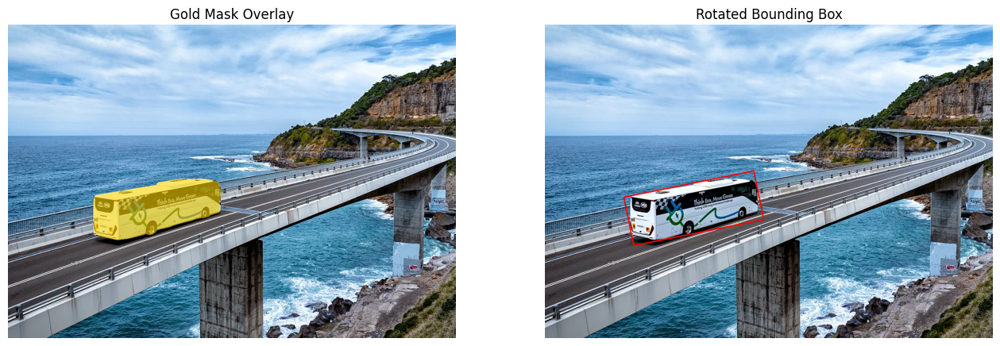

In [ ]:
image_path = "datasets/3d_tests/bus.jpg"
image = Image.open(image_path).convert("RGB")

inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = coco_model(**inputs)

results = coco_image_processor.post_process_object_detection(
    outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.9
)
result = results[0]  # take first image results

h, w = image.height, image.width

output_img = image.copy()
output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)
obb_img = output_img.copy()  # second image for rotated boxes

for box in result['boxes'].cpu().numpy():
    # Clamp and convert bbox coords
    x1 = max(0, min(w - 1, int(box[0])))
    y1 = max(0, min(h - 1, int(box[1])))
    x2 = max(0, min(w, int(box[2])))
    y2 = max(0, min(h, int(box[3])))

    # Skip invalid boxes
    if x2 <= x1 or y2 <= y1:
        print(f"Skipping invalid box {(x1, y1, x2, y2)}")
        continue
    print(f"Processing box {(x1, y1, x2, y2)}")

    box_prompt = np.array([[x1, y1, x2, y2]])

    predictor.set_image(output_img)
    sam_masks, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=box_prompt,
        multimask_output=False,
    )

    sam_mask_binary = sam_masks[0].astype(np.uint8)

    gold_color = (0, 215, 255)  # BGR for gold
    alpha = 0.6  # transparency (0 = fully transparent, 1 = fully opaque)
    overlay = output_img.copy()

    # Apply gold color to the masked area
    overlay[sam_mask_binary == 1] = gold_color

    # Blend overlay with original image
    output_img = cv2.addWeighted(overlay, alpha, output_img, 1 - alpha, 0)

    # # ---------------- Rotated bounding box ----------------
    # contours, _ = cv2.findContours(sam_mask_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # if contours:
    #     cnt = max(contours, key=cv2.contourArea)  # largest contour
    #     rect = cv2.minAreaRect(cnt)  # ((cx, cy), (w, h), angle)
    #     box_points = cv2.boxPoints(rect)  # 4 corner points
    #     box_points = box_points.astype(int)
    #     cv2.polylines(obb_img, [box_points], isClosed=True, color=(0, 0, 255), thickness=2)

    # ---------------- Robust rotated bounding box ----------------
    coords = np.column_stack(np.where(sam_mask_binary > 0))  # all mask points (y,x)

    if len(coords) > 0:
        # Swap to (x,y) for OpenCV
        coords_xy = coords[:, ::-1].astype(np.float32)

        # PCA to get main orientation
        mean, eigenvectors = cv2.PCACompute(coords_xy, mean=None)
        center = tuple(mean[0])
        angle = np.degrees(np.arctan2(eigenvectors[0,1], eigenvectors[0,0]))

        # minAreaRect on all points
        rect = cv2.minAreaRect(coords_xy)
        box_points = cv2.boxPoints(rect)
        box_points = np.int32(np.round(box_points))

        # Draw OBB
        cv2.polylines(obb_img, [box_points], isClosed=True, color=(0,0,255), thickness=2)

        print(f"Robust OBB Center: {rect[0]}, Size: {rect[1]}, Angle: {rect[2]}, PCA Angle: {angle}")

# Convert to RGB for matplotlib
mask_display = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)
obb_display = cv2.cvtColor(obb_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(mask_display)
plt.title("Gold Mask Overlay")

plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(obb_display)
plt.title("Rotated Bounding Box")

plt.show()

Processing box (460, 233, 558, 362)
Robust OBB Center: (511.199951171875, 297.9000244140625), Size: (128.79751586914062, 55.901702880859375), Angle: 63.43495178222656, PCA Angle: 62.220848083496094
Processing box (378, 232, 475, 368)
Robust OBB Center: (427.87322998046875, 300.5064697265625), Size: (135.95921325683594, 58.403411865234375), Angle: 60.524105072021484, PCA Angle: 61.89756774902344
Processing box (543, 76, 611, 209)
Robust OBB Center: (586.9736328125, 139.75247192382812), Size: (130.53501892089844, 61.95646667480469), Angle: 68.66313934326172, PCA Angle: 73.87252807617188
Processing box (223, 234, 314, 367)
Robust OBB Center: (265.8658447265625, 301.29266357421875), Size: (130.18740844726562, 56.782386779785156), Angle: 65.224853515625, PCA Angle: 64.8383560180664
Processing box (72, 86, 171, 217)
Robust OBB Center: (119.98699188232422, 151.80624389648438), Size: (129.24234008789062, 57.5532341003418), Angle: 64.35899353027344, PCA Angle: 64.1961669921875
Processing box (4

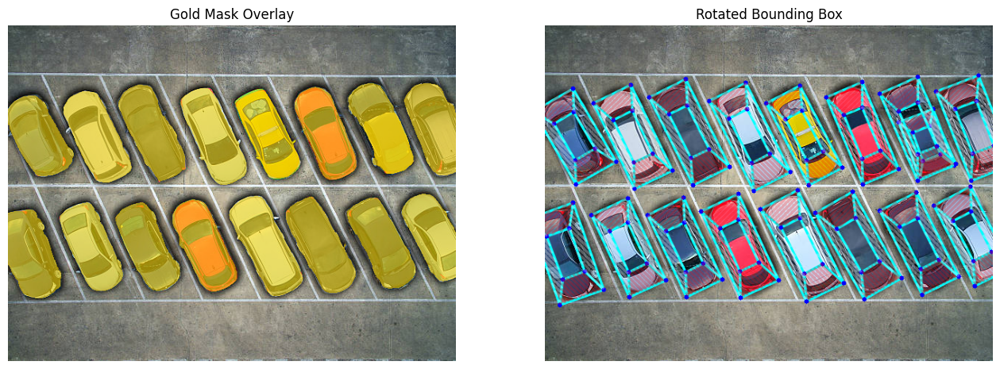

In [ ]:
image_path = "datasets/3d_tests_topview/cars-top-r.jpg"
image = Image.open(image_path).convert("RGB")

inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = coco_model(**inputs)

results = coco_image_processor.post_process_object_detection(
    outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.8
)
result = results[0]  # take first image results

h, w = image.height, image.width

# Camera intrinsics (simple guess)
fx = fy = w
cx, cy = w // 2, h // 2

depth_out = depth_pipe(image_path)
depth_map = np.array(depth_out["depth"], dtype=np.float32)
depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

# Resize to match original image size for bbox indexing
depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)

output_img = image.copy()
output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)
obb_img = output_img.copy()  # second image for rotated boxes

for box in result['boxes'].cpu().numpy():
    # Clamp and convert bbox coords
    x1 = max(0, min(w - 1, int(box[0])))
    y1 = max(0, min(h - 1, int(box[1])))
    x2 = max(0, min(w, int(box[2])))
    y2 = max(0, min(h, int(box[3])))

    # Skip invalid boxes
    if x2 <= x1 or y2 <= y1:
        print(f"Skipping invalid box {(x1, y1, x2, y2)}")
        continue
    print(f"Processing box {(x1, y1, x2, y2)}")

    box_prompt = np.array([[x1, y1, x2, y2]])

    predictor.set_image(output_img)
    sam_masks, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=box_prompt,
        multimask_output=False,
    )

    sam_mask_binary = sam_masks[0].astype(np.uint8)

    gold_color = (0, 215, 255)  # BGR for gold
    alpha = 0.6  # transparency (0 = fully transparent, 1 = fully opaque)
    overlay = output_img.copy()

    # Apply gold color to the masked area
    overlay[sam_mask_binary == 1] = gold_color

    # Blend overlay with original image
    output_img = cv2.addWeighted(overlay, alpha, output_img, 1 - alpha, 0)

    # ---------------- Robust rotated bounding box ----------------
    coords = np.column_stack(np.where(sam_mask_binary > 0))  # all mask points (y,x)

    if len(coords) > 0:
        # Swap to (x,y) for OpenCV
        coords_xy = coords[:, ::-1].astype(np.float32)

        # PCA to get main orientation
        mean, eigenvectors = cv2.PCACompute(coords_xy, mean=None)
        center = tuple(mean[0])
        angle = np.degrees(np.arctan2(eigenvectors[0,1], eigenvectors[0,0]))

        # minAreaRect on all points
        rect = cv2.minAreaRect(coords_xy)
        box_points = cv2.boxPoints(rect)
        box_points = np.int32(np.round(box_points))

        # Draw OBB
        #cv2.polylines(obb_img, [box_points], isClosed=True, color=(0,0,255), thickness=2)

        print(f"Robust OBB Center: {rect[0]}, Size: {rect[1]}, Angle: {rect[2]}, PCA Angle: {angle}")

        # 1) OBB mask
        obb_mask = np.zeros((h, w), dtype=np.uint8)
        cv2.fillPoly(obb_mask, [np.int32(box_points)], 1)

        # 2) Erode to keep only confident interior (avoid background at edges)
        kernel = np.ones((5, 5), np.uint8)
        obb_core = cv2.erode(obb_mask, kernel, iterations=1)
        if int(obb_core.sum()) < 50:  # fallback if object is small
            obb_core = obb_mask

        vals = depth_map[obb_core == 1]
        if vals.size == 0:
            print("Empty OBB depth region");
            continue

        # 3) Decide if your map is inverse-depth-like
        g5, g95 = np.percentile(depth_map, (5, 95))
        med = float(np.median(vals))
        invert = abs(med - g5) < abs(med - g95)  # if closer to low end, treat low as NEAR

        def norm_to_depth_m(d, invert=False, z_near=1.0, z_far=50.0):
            d = 1.0 - d if invert else d
            return z_near + d * (z_far - z_near)

        Z_NEAR, Z_FAR = 1.0, 50.0  # tweak to taste

        # 4) Front-face depth (meters)
        obj_depth = norm_to_depth_m(med, invert, Z_NEAR, Z_FAR)
        obj_depth = max(obj_depth, Z_NEAR + 0.1)  # keep away from near plane

        # 5) OBB size in meters at that depth
        obb_w_px, obb_h_px = rect[1]
        box_width  = (obb_w_px / fx) * obj_depth
        box_height = (obb_h_px / fy) * obj_depth
        diag_m = max(1e-6, float(np.hypot(box_width, box_height)))

        # 6) Depth extent from robust spread, mapped to meters and CLAMPED
        spread_norm = float(np.percentile(vals, 90) - np.percentile(vals, 10))
        spread_m = (Z_FAR - Z_NEAR) * spread_norm  # same mapping range as above
        # Clamp depth to a reasonable fraction of in-plane size
        box_depth = float(np.clip(spread_m, 0.15 * diag_m, 0.6 * diag_m))

        # 7) Front face: project OBB corners at obj_depth
        front_corners = []
        for (px, py) in box_points:
            Z = obj_depth
            X = ((float(px) - cx) / fx) * Z
            Y = ((float(py) - cy) / fy) * Z
            front_corners.append((X, Y, Z))

        # 8) Back face: shift along camera Z only (simple & stable)
        #back_corners = [(x, y, z + box_depth) for (x, y, z) in front_corners]
        # Compute 3D center of front face
        center_3d = np.mean(front_corners, axis=0)

        # Extrude back corners inward toward center
        back_corners = [tuple(np.array(pt) + (center_3d - np.array(pt)) * 0.5) for pt in front_corners]

        # 9) Assemble + draw
        corners_3d = front_corners + back_corners
        pts_2d = project_points(corners_3d, fx, fy, cx, cy)
        obb_img = draw_cube(obb_img, pts_2d, color=(255, 255, 0), thickness=2)

        # Draw corner points (red dots)
        for (x, y) in pts_2d:
            if x is not None and y is not None:
                cv2.circle(obb_img, (x, y), 3, (255, 0, 0), -1)

        top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
        bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
        side_face_pts = [pts_2d[i] for i in [5,1,2,6]]
        leftside_face_pts = [pts_2d[i] for i in [0,4,7,3]]

        obb_img = draw_slash_hatch_slanted(obb_img, top_face_pts, color=(0,0,255), spacing=5, thickness=2, direction=1, alpha=0.3)
        obb_img = draw_slash_hatch_slanted(obb_img, bottom_face_pts, color=(0,0,255), spacing=5, thickness=2, direction=-1, alpha=0.3)
        obb_img = draw_slash_hatch_slanted(obb_img, side_face_pts, color=(255,255,255), spacing=5, thickness=2, direction=-1, alpha=0.3)
        obb_img = draw_slash_hatch_slanted(obb_img, leftside_face_pts, color=(255,255,255), spacing=5, thickness=2, direction=-1, alpha=0.3)

# Convert to RGB for matplotlib
mask_display = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)
obb_display = cv2.cvtColor(obb_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(mask_display)
plt.title("Gold Mask Overlay")

plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(obb_display)
plt.title("Rotated Bounding Box")

plt.show()

Processing box (499, 21, 689, 166), class_id: 5
Robust OBB Center: (588.25, 89.75000762939453), Size: (122.7686996459961, 175.1317138671875), Angle: 78.69007110595703, PCA Angle: 4.31882381439209
Processing box (339, 41, 441, 152), class_id: 5
Robust OBB Center: (381.9757080078125, 100.8555679321289), Size: (78.0007553100586, 92.44381713867188), Angle: 35.44571304321289, PCA Angle: -20.091493606567383
Processing box (156, 172, 657, 297), class_id: 9
Robust OBB Center: (402.4617919921875, 232.90135192871094), Size: (98.63735961914062, 506.3330078125), Angle: 86.1974105834961, PCA Angle: -6.3019938468933105


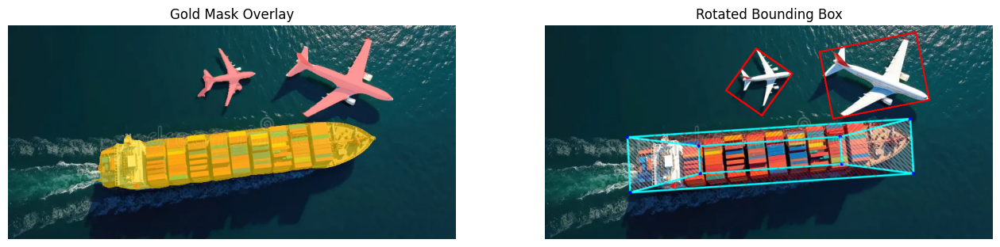

In [ ]:
image_path = "datasets/3d_tests_topview/airplane-ship-top.jpg"
image = Image.open(image_path).convert("RGB")

inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = coco_model(**inputs)

results = coco_image_processor.post_process_object_detection(
    outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.1
)
result = results[0]  # take first image results

h, w = image.height, image.width

# Camera intrinsics (simple guess)
fx = fy = w
cx, cy = w // 2, h // 2

depth_out = depth_pipe(image_path)
depth_map = np.array(depth_out["depth"], dtype=np.float32)
depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

# Resize to match original image size for bbox indexing
depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)

output_img = image.copy()
output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)
obb_img = output_img.copy()  # second image for rotated boxes

# Get boxes and scores from DETR output
boxes = result["boxes"]  # tensor [N, 4]
scores = result["scores"]  # tensor [N]
labels = result["labels"]  # tensor [N]

# Run PyTorch NMS
nms_threshold = 0.5  # IoU threshold
keep_indices = nms(boxes, scores, nms_threshold)

# Filter results
boxes = boxes[keep_indices]
scores = scores[keep_indices]
labels = labels[keep_indices]

boxes = boxes.cpu().numpy()
labels = labels.cpu().numpy()
scores = scores.cpu().numpy()

for i, box in enumerate(boxes):
    x1 = max(0, min(w - 1, int(box[0])))
    y1 = max(0, min(h - 1, int(box[1])))
    x2 = max(0, min(w, int(box[2])))
    y2 = max(0, min(h, int(box[3])))

    if x2 <= x1 or y2 <= y1:
        print(f"Skipping invalid box {(x1, y1, x2, y2)}")
        continue

    class_id = labels[i]  # <-- this is the class ID
    print(f"Processing box {(x1, y1, x2, y2)}, class_id: {class_id}")

    box_prompt = np.array([[x1, y1, x2, y2]])

    predictor.set_image(output_img)
    sam_masks, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=box_prompt,
        multimask_output=False,
    )

    sam_mask_binary = sam_masks[0].astype(np.uint8)

    if class_id == 5:
        # light red color
        mask_color = (127, 127, 255)
        alpha = 0.8  # transparency (0 = fully transparent, 1 = fully opaque)
    else:
        mask_color = (0, 215, 255)  # BGR for gold
        alpha = 0.6  # transparency (0 = fully transparent, 1 = fully opaque)

    overlay = output_img.copy()

    # Apply color to the masked area
    overlay[sam_mask_binary == 1] = mask_color

    # Blend overlay with original image
    output_img = cv2.addWeighted(overlay, alpha, output_img, 1 - alpha, 0)

    # ---------------- Robust rotated bounding box ----------------
    coords = np.column_stack(np.where(sam_mask_binary > 0))  # all mask points (y,x)

    if len(coords) > 0:
        # Swap to (x,y) for OpenCV
        coords_xy = coords[:, ::-1].astype(np.float32)

        # PCA to get main orientation
        mean, eigenvectors = cv2.PCACompute(coords_xy, mean=None)
        center = tuple(mean[0])
        angle = np.degrees(np.arctan2(eigenvectors[0,1], eigenvectors[0,0]))

        # minAreaRect on all points
        rect = cv2.minAreaRect(coords_xy)
        box_points = cv2.boxPoints(rect)
        box_points = np.int32(np.round(box_points))

        print(f"Robust OBB Center: {rect[0]}, Size: {rect[1]}, Angle: {rect[2]}, PCA Angle: {angle}")

        if class_id == 5:
            # Draw OBB
            cv2.polylines(obb_img, [box_points], isClosed=True, color=(0,0,255), thickness=2)
        else:
            # 1) OBB mask
            obb_mask = np.zeros((h, w), dtype=np.uint8)
            cv2.fillPoly(obb_mask, [np.int32(box_points)], 1)

            # 2) Erode to keep only confident interior (avoid background at edges)
            kernel = np.ones((5, 5), np.uint8)
            obb_core = cv2.erode(obb_mask, kernel, iterations=1)
            if int(obb_core.sum()) < 50:  # fallback if object is small
                obb_core = obb_mask

            vals = depth_map[obb_core == 1]
            if vals.size == 0:
                print("Empty OBB depth region");
                continue

            # 3) Decide if your map is inverse-depth-like
            g5, g95 = np.percentile(depth_map, (5, 95))
            med = float(np.median(vals))
            invert = abs(med - g5) < abs(med - g95)  # if closer to low end, treat low as NEAR

            def norm_to_depth_m(d, invert=False, z_near=1.0, z_far=50.0):
                d = 1.0 - d if invert else d
                return z_near + d * (z_far - z_near)

            Z_NEAR, Z_FAR = 1.0, 50.0  # tweak to taste

            # 4) Front-face depth (meters)
            obj_depth = norm_to_depth_m(med, invert, Z_NEAR, Z_FAR)
            obj_depth = max(obj_depth, Z_NEAR + 0.1)  # keep away from near plane

            # 5) OBB size in meters at that depth
            obb_w_px, obb_h_px = rect[1]
            box_width  = (obb_w_px / fx) * obj_depth
            box_height = (obb_h_px / fy) * obj_depth
            diag_m = max(1e-6, float(np.hypot(box_width, box_height)))

            # 6) Depth extent from robust spread, mapped to meters and CLAMPED
            spread_norm = float(np.percentile(vals, 90) - np.percentile(vals, 10))
            spread_m = (Z_FAR - Z_NEAR) * spread_norm  # same mapping range as above
            # Clamp depth to a reasonable fraction of in-plane size
            box_depth = float(np.clip(spread_m, 0.15 * diag_m, 0.6 * diag_m))

            # 7) Front face: project OBB corners at obj_depth
            front_corners = []
            for (px, py) in box_points:
                Z = obj_depth
                X = ((float(px) - cx) / fx) * Z
                Y = ((float(py) - cy) / fy) * Z
                front_corners.append((X, Y, Z))

            # 8) Back face: shift along camera Z only (simple & stable)
            #back_corners = [(x, y, z + box_depth) for (x, y, z) in front_corners]
            # Compute 3D center of front face
            center_3d = np.mean(front_corners, axis=0)

            # Extrude back corners inward toward center
            back_corners = [tuple(np.array(pt) + (center_3d - np.array(pt)) * 0.5) for pt in front_corners]

            # 9) Assemble + draw
            corners_3d = front_corners + back_corners
            pts_2d = project_points(corners_3d, fx, fy, cx, cy)
            obb_img = draw_cube(obb_img, pts_2d, color=(255, 255, 0), thickness=2)

            # Draw corner points (red dots)
            for (x, y) in pts_2d:
                if x is not None and y is not None:
                    cv2.circle(obb_img, (x, y), 3, (255, 0, 0), -1)

            top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
            bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
            side_face_pts = [pts_2d[i] for i in [5,1,2,6]]
            leftside_face_pts = [pts_2d[i] for i in [0,4,7,3]]

            obb_img = draw_slash_hatch_slanted(obb_img, top_face_pts, color=(0,0,255), spacing=5, thickness=2, direction=1, alpha=0.3)
            obb_img = draw_slash_hatch_slanted(obb_img, bottom_face_pts, color=(0,0,255), spacing=5, thickness=2, direction=-1, alpha=0.3)
            obb_img = draw_slash_hatch_slanted(obb_img, side_face_pts, color=(255,255,255), spacing=5, thickness=2, direction=-1, alpha=0.3)
            obb_img = draw_slash_hatch_slanted(obb_img, leftside_face_pts, color=(255,255,255), spacing=5, thickness=2, direction=-1, alpha=0.3)

# Convert to RGB for matplotlib
mask_display = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)
obb_display = cv2.cvtColor(obb_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(mask_display)
plt.title("Gold Mask Overlay")

plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(obb_display)
plt.title("Rotated Bounding Box")

plt.show()

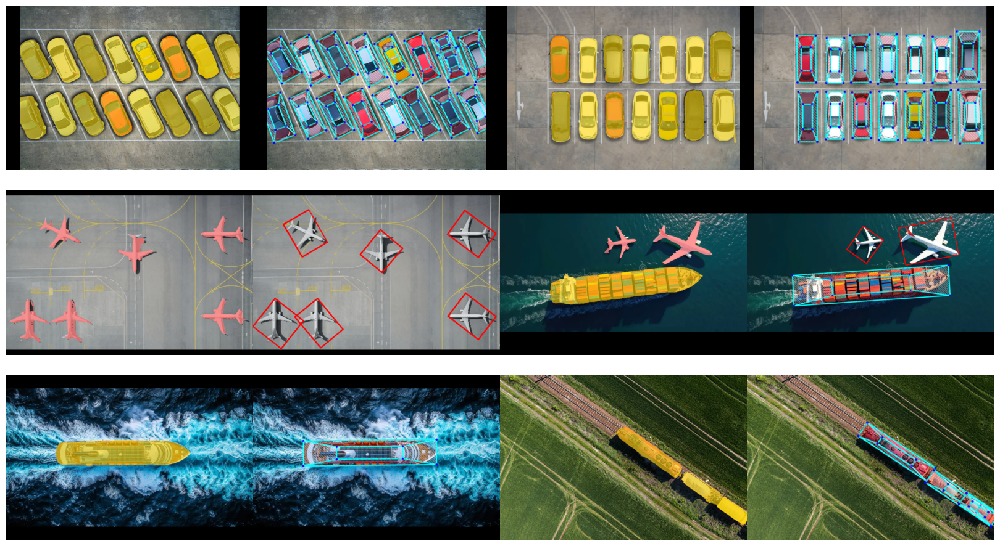

In [ ]:
val_dir = "datasets/3d_tests_topview"
num_samples = 6

all_imgs = [f for f in os.listdir(val_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_imgs = random.sample(all_imgs, min(num_samples, len(all_imgs)))
img_paths = [os.path.join(val_dir, fname) for fname in selected_imgs]

processed_imgs = []
img_sizes = []

for image_path in img_paths:
    # Load image
    image = Image.open(image_path).convert("RGB")

    inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = coco_model(**inputs)

    results = coco_image_processor.post_process_object_detection(
        outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.2
    )
    result = results[0]  # take first image results

    h, w = image.height, image.width

    # Camera intrinsics (simple guess)
    fx = fy = w
    cx, cy = w // 2, h // 2

    depth_out = depth_pipe(image_path)
    depth_map = np.array(depth_out["depth"], dtype=np.float32)
    depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

    # Resize to match original image size for bbox indexing
    depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)

    output_img = image.copy()
    output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)
    obb_img = output_img.copy()  # second image for rotated boxes

    # Get boxes and scores from DETR output
    boxes = result["boxes"]  # tensor [N, 4]
    scores = result["scores"]  # tensor [N]
    labels = result["labels"]  # tensor [N]

    # Run PyTorch NMS
    nms_threshold = 0.5  # IoU threshold
    keep_indices = nms(boxes, scores, nms_threshold)

    # Filter results
    boxes = boxes[keep_indices]
    scores = scores[keep_indices]
    labels = labels[keep_indices]

    boxes = boxes.cpu().numpy()
    labels = labels.cpu().numpy()
    scores = scores.cpu().numpy()

    for i, box in enumerate(boxes):
        x1 = max(0, min(w - 1, int(box[0])))
        y1 = max(0, min(h - 1, int(box[1])))
        x2 = max(0, min(w, int(box[2])))
        y2 = max(0, min(h, int(box[3])))

        if x2 <= x1 or y2 <= y1:
            print(f"Skipping invalid box {(x1, y1, x2, y2)}")
            continue

        class_id = labels[i]  # <-- this is the class ID
        #print(f"Processing box {(x1, y1, x2, y2)}, class_id: {class_id}")

        box_prompt = np.array([[x1, y1, x2, y2]])

        predictor.set_image(output_img)
        sam_masks, _, _ = predictor.predict(
            point_coords=None,
            point_labels=None,
            box=box_prompt,
            multimask_output=False,
        )

        sam_mask_binary = sam_masks[0].astype(np.uint8)

        if class_id == 5:
            # light red color
            mask_color = (127, 127, 255)
            alpha = 0.8  # transparency (0 = fully transparent, 1 = fully opaque)
        else:
            mask_color = (0, 215, 255)  # BGR for gold
            alpha = 0.6  # transparency (0 = fully transparent, 1 = fully opaque)

        overlay = output_img.copy()

        # Apply color to the masked area
        overlay[sam_mask_binary == 1] = mask_color

        # Blend overlay with original image
        output_img = cv2.addWeighted(overlay, alpha, output_img, 1 - alpha, 0)

        # ---------------- Robust rotated bounding box ----------------
        coords = np.column_stack(np.where(sam_mask_binary > 0))  # all mask points (y,x)

        if len(coords) > 0:
            # Swap to (x,y) for OpenCV
            coords_xy = coords[:, ::-1].astype(np.float32)

            # PCA to get main orientation
            mean, eigenvectors = cv2.PCACompute(coords_xy, mean=None)
            center = tuple(mean[0])
            angle = np.degrees(np.arctan2(eigenvectors[0,1], eigenvectors[0,0]))

            # minAreaRect on all points
            rect = cv2.minAreaRect(coords_xy)
            box_points = cv2.boxPoints(rect)
            box_points = np.int32(np.round(box_points))

            #print(f"Robust OBB Center: {rect[0]}, Size: {rect[1]}, Angle: {rect[2]}, PCA Angle: {angle}")

            if class_id == 5:
                # Draw OBB
                cv2.polylines(obb_img, [box_points], isClosed=True, color=(0,0,255), thickness=2)
            else:
                # 1) OBB mask
                obb_mask = np.zeros((h, w), dtype=np.uint8)
                cv2.fillPoly(obb_mask, [np.int32(box_points)], 1)

                # 2) Erode to keep only confident interior (avoid background at edges)
                kernel = np.ones((5, 5), np.uint8)
                obb_core = cv2.erode(obb_mask, kernel, iterations=1)
                if int(obb_core.sum()) < 50:  # fallback if object is small
                    obb_core = obb_mask

                vals = depth_map[obb_core == 1]
                if vals.size == 0:
                    print("Empty OBB depth region");
                    continue

                # 3) Decide if your map is inverse-depth-like
                g5, g95 = np.percentile(depth_map, (5, 95))
                med = float(np.median(vals))
                invert = abs(med - g5) < abs(med - g95)  # if closer to low end, treat low as NEAR

                def norm_to_depth_m(d, invert=False, z_near=1.0, z_far=50.0):
                    d = 1.0 - d if invert else d
                    return z_near + d * (z_far - z_near)

                Z_NEAR, Z_FAR = 1.0, 50.0  # tweak to taste

                # 4) Front-face depth (meters)
                obj_depth = norm_to_depth_m(med, invert, Z_NEAR, Z_FAR)
                obj_depth = max(obj_depth, Z_NEAR + 0.1)  # keep away from near plane

                # 5) OBB size in meters at that depth
                obb_w_px, obb_h_px = rect[1]
                box_width  = (obb_w_px / fx) * obj_depth
                box_height = (obb_h_px / fy) * obj_depth
                diag_m = max(1e-6, float(np.hypot(box_width, box_height)))

                # 6) Depth extent from robust spread, mapped to meters and CLAMPED
                spread_norm = float(np.percentile(vals, 90) - np.percentile(vals, 10))
                spread_m = (Z_FAR - Z_NEAR) * spread_norm  # same mapping range as above
                # Clamp depth to a reasonable fraction of in-plane size
                box_depth = float(np.clip(spread_m, 0.15 * diag_m, 0.6 * diag_m))

                # 7) Front face: project OBB corners at obj_depth
                front_corners = []
                for (px, py) in box_points:
                    Z = obj_depth
                    X = ((float(px) - cx) / fx) * Z
                    Y = ((float(py) - cy) / fy) * Z
                    front_corners.append((X, Y, Z))

                # 8) Back face: shift along camera Z only (simple & stable)
                #back_corners = [(x, y, z + box_depth) for (x, y, z) in front_corners]
                # Compute 3D center of front face
                center_3d = np.mean(front_corners, axis=0)

                # Extrude back corners inward toward center
                back_corners = [tuple(np.array(pt) + (center_3d - np.array(pt)) * 0.5) for pt in front_corners]

                # 9) Assemble + draw
                corners_3d = front_corners + back_corners
                pts_2d = project_points(corners_3d, fx, fy, cx, cy)
                obb_img = draw_cube(obb_img, pts_2d, color=(255, 255, 0), thickness=2)

                # Draw corner points (red dots)
                for (x, y) in pts_2d:
                    if x is not None and y is not None:
                        cv2.circle(obb_img, (x, y), 3, (255, 0, 0), -1)

                top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
                bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
                side_face_pts = [pts_2d[i] for i in [5,1,2,6]]
                leftside_face_pts = [pts_2d[i] for i in [0,4,7,3]]

                obb_img = draw_slash_hatch_slanted(obb_img, top_face_pts, color=(0,0,255), spacing=5, thickness=2, direction=1, alpha=0.3)
                obb_img = draw_slash_hatch_slanted(obb_img, bottom_face_pts, color=(0,0,255), spacing=5, thickness=2, direction=-1, alpha=0.3)
                obb_img = draw_slash_hatch_slanted(obb_img, side_face_pts, color=(255,255,255), spacing=5, thickness=2, direction=-1, alpha=0.3)
                obb_img = draw_slash_hatch_slanted(obb_img, leftside_face_pts, color=(255,255,255), spacing=5, thickness=2, direction=-1, alpha=0.3)

    # Convert to RGB for matplotlib
    mask_display = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)
    obb_display = cv2.cvtColor(obb_img, cv2.COLOR_BGR2RGB)

    processed_imgs.append((mask_display, obb_display))
    img_sizes.append(output_img.shape[:2])  # (height, width)

cols = 4  # 2 images x 2 visuals = 4 subplots per row
rows = (len(processed_imgs) + 1) // 2  # 2 images per row

plt.figure(figsize=(4 * cols, 3 * rows))

# Target display size for each grid cell
target_height = 720
target_width = 1080

for idx, (img1, img2) in enumerate(processed_imgs):
    for view_idx, view in enumerate([img1, img2]):
        h, w = view.shape[:2]

        # Scale keeping aspect ratio
        scale = min(target_width / w, target_height / h)
        new_w, new_h = int(w * scale), int(h * scale)
        resized = cv2.resize(view, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

        # Pad to target size
        top = (target_height - new_h) // 2
        bottom = target_height - new_h - top
        left = (target_width - new_w) // 2
        right = target_width - new_w - left
        padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                    borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

        plot_idx = idx * 2 + view_idx + 1
        plt.subplot(rows, cols, plot_idx)
        plt.imshow(padded)
        plt.axis('off')

plt.tight_layout(pad=0)           # removes padding around the whole figure
plt.subplots_adjust(wspace=0, hspace=0)  # removes spacing between cells
plt.show()

Processing box (200, 166, 551, 339), class_id: 8
Robust OBB Center: (371.9385070800781, 248.82376098632812), Size: (164.77505493164062, 352.8178405761719), Angle: 84.80557250976562, PCA Angle: -3.349177360534668


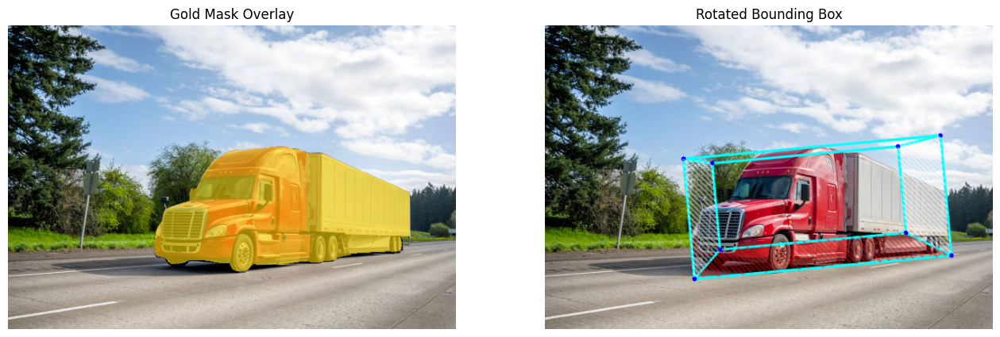

In [91]:
image_path = "datasets/3d_tests/truck-red.jpg"

image = Image.open(image_path).convert("RGB")

inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = coco_model(**inputs)

results = coco_image_processor.post_process_object_detection(
    outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.5
)
result = results[0]  # take first image results

h, w = image.height, image.width

# Camera intrinsics (simple guess)
fx = fy = w
cx, cy = w // 2, h // 2

depth_out = depth_pipe(image_path)
depth_map = np.array(depth_out["depth"], dtype=np.float32)
depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

# Resize to match original image size for bbox indexing
depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)

output_img = image.copy()
output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)
obb_img = output_img.copy()  # second image for rotated boxes

# Get boxes and scores from DETR output
boxes = result["boxes"]  # tensor [N, 4]
scores = result["scores"]  # tensor [N]
labels = result["labels"]  # tensor [N]

# Run PyTorch NMS
nms_threshold = 0.5  # IoU threshold
keep_indices = nms(boxes, scores, nms_threshold)

# Filter results
boxes = boxes[keep_indices]
scores = scores[keep_indices]
labels = labels[keep_indices]

boxes = boxes.cpu().numpy()
labels = labels.cpu().numpy()
scores = scores.cpu().numpy()

for i, box in enumerate(boxes):
    x1 = max(0, min(w - 1, int(box[0])))
    y1 = max(0, min(h - 1, int(box[1])))
    x2 = max(0, min(w, int(box[2])))
    y2 = max(0, min(h, int(box[3])))

    if x2 <= x1 or y2 <= y1:
        print(f"Skipping invalid box {(x1, y1, x2, y2)}")
        continue

    class_id = labels[i]  # <-- this is the class ID
    print(f"Processing box {(x1, y1, x2, y2)}, class_id: {class_id}")

    box_prompt = np.array([[x1, y1, x2, y2]])

    predictor.set_image(output_img)
    sam_masks, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=box_prompt,
        multimask_output=False,
    )

    sam_mask_binary = sam_masks[0].astype(np.uint8)

    if class_id == 5:
        # light red color
        mask_color = (127, 127, 255)
        alpha = 0.8  # transparency (0 = fully transparent, 1 = fully opaque)
    elif class_id == 1:
        # light red color
        mask_color = (127, 127, 255)
        alpha = 0.8  # transparency (0 = fully transparent, 1 = fully opaque)
        cubecolor = (127, 127, 255)
    else:
        mask_color = (0, 215, 255)  # BGR for gold
        alpha = 0.6  # transparency (0 = fully transparent, 1 = fully opaque)
        cubecolor = (255, 255, 0)

    overlay = output_img.copy()

    # Apply color to the masked area
    overlay[sam_mask_binary == 1] = mask_color

    # Blend overlay with original image
    output_img = cv2.addWeighted(overlay, alpha, output_img, 1 - alpha, 0)

    # ---------------- Robust rotated bounding box ----------------
    coords = np.column_stack(np.where(sam_mask_binary > 0))  # all mask points (y,x)

    if len(coords) > 0:
        # Swap to (x,y) for OpenCV
        coords_xy = coords[:, ::-1].astype(np.float32)

        # PCA to get main orientation
        mean, eigenvectors = cv2.PCACompute(coords_xy, mean=None)
        center = tuple(mean[0])
        angle = np.degrees(np.arctan2(eigenvectors[0,1], eigenvectors[0,0]))

        # minAreaRect on all points
        rect = cv2.minAreaRect(coords_xy)
        box_points = cv2.boxPoints(rect)
        box_points = np.int32(np.round(box_points))

        print(f"Robust OBB Center: {rect[0]}, Size: {rect[1]}, Angle: {rect[2]}, PCA Angle: {angle}")

        if class_id == 5:
            # Draw OBB
            cv2.polylines(obb_img, [box_points], isClosed=True, color=(0,0,255), thickness=2)
        else:
            # 1) OBB mask
            obb_mask = np.zeros((h, w), dtype=np.uint8)
            cv2.fillPoly(obb_mask, [np.int32(box_points)], 1)

            # 2) Erode to keep only confident interior (avoid background at edges)
            kernel = np.ones((5, 5), np.uint8)
            obb_core = cv2.erode(obb_mask, kernel, iterations=1)
            if int(obb_core.sum()) < 50:  # fallback if object is small
                obb_core = obb_mask

            vals = depth_map[obb_core == 1]
            if vals.size == 0:
                print("Empty OBB depth region");
                continue

            # 3) Decide if your map is inverse-depth-like
            g5, g95 = np.percentile(depth_map, (5, 95))
            med = float(np.median(vals))
            invert = abs(med - g5) < abs(med - g95)  # if closer to low end, treat low as NEAR

            def norm_to_depth_m(d, invert=False, z_near=1.0, z_far=50.0):
                d = 1.0 - d if invert else d
                return z_near + d * (z_far - z_near)

            Z_NEAR, Z_FAR = 1.0, 50.0  # tweak to taste

            # 4) Front-face depth (meters)
            obj_depth = norm_to_depth_m(med, invert, Z_NEAR, Z_FAR)
            obj_depth = max(obj_depth, Z_NEAR + 0.1)  # keep away from near plane

            # 5) OBB size in meters at that depth
            obb_w_px, obb_h_px = rect[1]
            box_width  = (obb_w_px / fx) * obj_depth
            box_height = (obb_h_px / fy) * obj_depth
            diag_m = max(1e-6, float(np.hypot(box_width, box_height)))

            # 6) Depth extent from robust spread, mapped to meters and CLAMPED
            spread_norm = float(np.percentile(vals, 90) - np.percentile(vals, 10))
            spread_m = (Z_FAR - Z_NEAR) * spread_norm  # same mapping range as above
            # Clamp depth to a reasonable fraction of in-plane size
            box_depth = float(np.clip(spread_m, 0.15 * diag_m, 0.6 * diag_m))

            # 7) Front face: project OBB corners at obj_depth
            front_corners = []
            for (px, py) in box_points:
                Z = obj_depth
                X = ((float(px) - cx) / fx) * Z
                Y = ((float(py) - cy) / fy) * Z
                front_corners.append((X, Y, Z))

            # --- Back face extrusion using 3D front corners (robust, stable) ---
            front_corners_np = np.array(front_corners)  # shape [4,3]

            # Compute 3D right direction along the longest edge of the front face
            edges_3d = [
                front_corners_np[1] - front_corners_np[0],
                front_corners_np[2] - front_corners_np[1],
                front_corners_np[3] - front_corners_np[2],
                front_corners_np[0] - front_corners_np[3]
            ]
            edge_lengths = [np.linalg.norm(e) for e in edges_3d]
            longest_edge_idx = np.argmax(edge_lengths)
            right_dir_3d = edges_3d[longest_edge_idx] / (edge_lengths[longest_edge_idx] + 1e-6)

            # Stable right-side extrusion: X/Y along longest edge, Z forward
            back_corners = []
            for fc in front_corners_np:
                # Use unit right vector along longest edge
                dx = right_dir_3d[0] * 0.5  # fixed in-plane offset in meters
                dy = right_dir_3d[1] * 0.5
                dz = box_depth             # forward along Z
                back_corners.append((fc[0] + dx, fc[1] + dy, fc[2] + dz))

            # 9) Assemble + draw
            corners_3d = front_corners + back_corners

            # Order corners: top 4, bottom 4
            ordered = [corners_3d[i] for i in [0,1,2,3,4,5,6,7]]

            pts_2d = project_points(ordered, fx, fy, cx, cy)
            obb_img = draw_cube(obb_img, pts_2d, color=cubecolor, thickness=2)

            # Draw corner points (red dots)
            for (x, y) in pts_2d:
                if x is not None and y is not None:
                    cv2.circle(obb_img, (x, y), 3, (255, 0, 0), -1)

            top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
            bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
            side_face_pts = [pts_2d[i] for i in [5,1,2,6]]
            leftside_face_pts = [pts_2d[i] for i in [0,4,7,3]]

            #obb_img = draw_slash_hatch_slanted(obb_img, top_face_pts, color=(0,0,255), spacing=5, thickness=2, direction=1, alpha=0.3)
            obb_img = draw_slash_hatch_slanted(obb_img, bottom_face_pts, color=(0,0,255), spacing=5, thickness=2, direction=-1, alpha=0.4)
            obb_img = draw_slash_hatch_slanted(obb_img, side_face_pts, color=(255,255,255), spacing=5, thickness=2, direction=-1, alpha=0.4)
            obb_img = draw_slash_hatch_slanted(obb_img, leftside_face_pts, color=(255,255,255), spacing=5, thickness=2, direction=-1, alpha=0.4)

# Convert to RGB for matplotlib
mask_display = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)
obb_display = cv2.cvtColor(obb_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(mask_display)
plt.title("Gold Mask Overlay")

plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(obb_display)
plt.title("Rotated Bounding Box")

plt.show()

Processing box (74, 209, 738, 504), class_id: 15
Robust OBB Center: (409.1673583984375, 354.3035888671875), Size: (281.4495544433594, 658.0164184570312), Angle: 88.93515014648438, PCA Angle: -0.17993693053722382


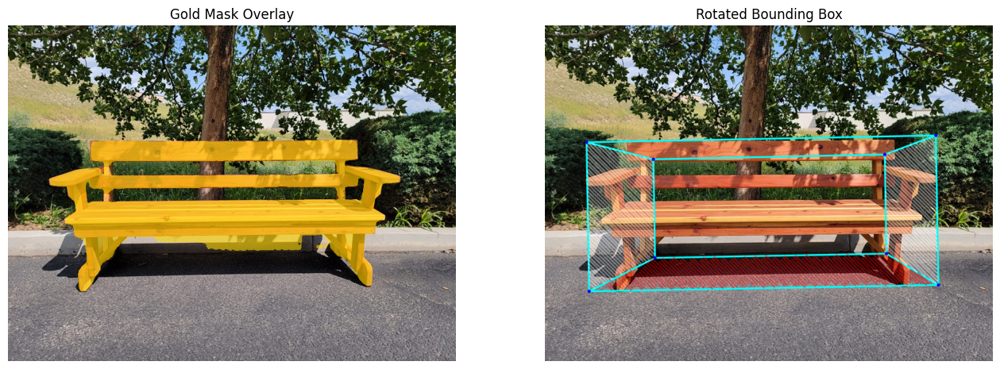

In [95]:
image_path = "datasets/3d_tests/bench.jpg"

image = Image.open(image_path).convert("RGB")

inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = coco_model(**inputs)

results = coco_image_processor.post_process_object_detection(
    outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.5
)
result = results[0]  # take first image results

h, w = image.height, image.width

# Camera intrinsics (simple guess)
fx = fy = w
cx, cy = w // 2, h // 2

depth_out = depth_pipe(image_path)
depth_map = np.array(depth_out["depth"], dtype=np.float32)
depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

# Resize to match original image size for bbox indexing
depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)

output_img = image.copy()
output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)
obb_img = output_img.copy()  # second image for rotated boxes

# Get boxes and scores from DETR output
boxes = result["boxes"]  # tensor [N, 4]
scores = result["scores"]  # tensor [N]
labels = result["labels"]  # tensor [N]

# Run PyTorch NMS
nms_threshold = 0.5  # IoU threshold
keep_indices = nms(boxes, scores, nms_threshold)

# Filter results
boxes = boxes[keep_indices]
scores = scores[keep_indices]
labels = labels[keep_indices]

boxes = boxes.cpu().numpy()
labels = labels.cpu().numpy()
scores = scores.cpu().numpy()

for i, box in enumerate(boxes):
    x1 = max(0, min(w - 1, int(box[0])))
    y1 = max(0, min(h - 1, int(box[1])))
    x2 = max(0, min(w, int(box[2])))
    y2 = max(0, min(h, int(box[3])))

    if x2 <= x1 or y2 <= y1:
        print(f"Skipping invalid box {(x1, y1, x2, y2)}")
        continue

    class_id = labels[i]  # <-- this is the class ID
    print(f"Processing box {(x1, y1, x2, y2)}, class_id: {class_id}")

    box_prompt = np.array([[x1, y1, x2, y2]])

    predictor.set_image(output_img)
    sam_masks, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=box_prompt,
        multimask_output=False,
    )

    sam_mask_binary = sam_masks[0].astype(np.uint8)

    if class_id == 5:
        # light red color
        mask_color = (127, 127, 255)
        alpha = 0.8  # transparency (0 = fully transparent, 1 = fully opaque)
    elif class_id == 1:
        # light red color
        mask_color = (127, 127, 255)
        alpha = 0.8  # transparency (0 = fully transparent, 1 = fully opaque)
        cubecolor = (127, 127, 255)
    else:
        mask_color = (0, 215, 255)  # BGR for gold
        alpha = 0.6  # transparency (0 = fully transparent, 1 = fully opaque)
        cubecolor = (255, 255, 0)

    overlay = output_img.copy()

    # Apply color to the masked area
    overlay[sam_mask_binary == 1] = mask_color

    # Blend overlay with original image
    output_img = cv2.addWeighted(overlay, alpha, output_img, 1 - alpha, 0)

    # ---------------- Robust rotated bounding box ----------------
    coords = np.column_stack(np.where(sam_mask_binary > 0))  # all mask points (y,x)

    if len(coords) > 0:
        # Swap to (x,y) for OpenCV
        coords_xy = coords[:, ::-1].astype(np.float32)

        # PCA to get main orientation
        mean, eigenvectors = cv2.PCACompute(coords_xy, mean=None)
        center = tuple(mean[0])
        angle = np.degrees(np.arctan2(eigenvectors[0,1], eigenvectors[0,0]))

        # minAreaRect on all points
        rect = cv2.minAreaRect(coords_xy)
        box_points = cv2.boxPoints(rect)
        box_points = np.int32(np.round(box_points))

        print(f"Robust OBB Center: {rect[0]}, Size: {rect[1]}, Angle: {rect[2]}, PCA Angle: {angle}")

        if class_id == 5:
            # Draw OBB
            cv2.polylines(obb_img, [box_points], isClosed=True, color=(0,0,255), thickness=2)
        else:
            # 1) OBB mask
            obb_mask = np.zeros((h, w), dtype=np.uint8)
            cv2.fillPoly(obb_mask, [np.int32(box_points)], 1)

            # 2) Erode to keep only confident interior (avoid background at edges)
            kernel = np.ones((5, 5), np.uint8)
            obb_core = cv2.erode(obb_mask, kernel, iterations=1)
            if int(obb_core.sum()) < 50:  # fallback if object is small
                obb_core = obb_mask

            vals = depth_map[obb_core == 1]
            if vals.size == 0:
                print("Empty OBB depth region");
                continue

            # 3) Decide if your map is inverse-depth-like
            g5, g95 = np.percentile(depth_map, (5, 95))
            med = float(np.median(vals))
            invert = abs(med - g5) < abs(med - g95)  # if closer to low end, treat low as NEAR

            def norm_to_depth_m(d, invert=False, z_near=1.0, z_far=50.0):
                d = 1.0 - d if invert else d
                return z_near + d * (z_far - z_near)

            Z_NEAR, Z_FAR = 1.0, 50.0  # tweak to taste

            # 4) Front-face depth (meters)
            obj_depth = norm_to_depth_m(med, invert, Z_NEAR, Z_FAR)
            obj_depth = max(obj_depth, Z_NEAR + 0.1)  # keep away from near plane

            # 5) OBB size in meters at that depth
            obb_w_px, obb_h_px = rect[1]
            box_width  = (obb_w_px / fx) * obj_depth
            box_height = (obb_h_px / fy) * obj_depth
            diag_m = max(1e-6, float(np.hypot(box_width, box_height)))

            # 6) Depth extent from robust spread, mapped to meters and CLAMPED
            spread_norm = float(np.percentile(vals, 90) - np.percentile(vals, 10))
            spread_m = (Z_FAR - Z_NEAR) * spread_norm  # same mapping range as above
            # Clamp depth to a reasonable fraction of in-plane size
            box_depth = float(np.clip(spread_m, 0.15 * diag_m, 0.6 * diag_m))

            # 7) Front face: project OBB corners at obj_depth
            front_corners = []
            for (px, py) in box_points:
                Z = obj_depth
                X = ((float(px) - cx) / fx) * Z
                Y = ((float(py) - cy) / fy) * Z
                front_corners.append((X, Y, Z))

            # --- Back face extrusion using 3D front corners (robust, stable) ---
            front_corners_np = np.array(front_corners)  # shape [4,3]

            # Compute 3D right direction along the longest edge of the front face
            edges_3d = [
                front_corners_np[1] - front_corners_np[0],
                front_corners_np[2] - front_corners_np[1],
                front_corners_np[3] - front_corners_np[2],
                front_corners_np[0] - front_corners_np[3]
            ]
            edge_lengths = [np.linalg.norm(e) for e in edges_3d]
            longest_edge_idx = np.argmax(edge_lengths)
            right_dir_3d = edges_3d[longest_edge_idx] / (edge_lengths[longest_edge_idx] + 1e-6)

            # Stable right-side extrusion: X/Y along longest edge, Z forward
            back_corners = []
            for fc in front_corners_np:
                # Use unit right vector along longest edge
                dx = right_dir_3d[0] * 0.5  # fixed in-plane offset in meters
                dy = right_dir_3d[1] * 0.5
                dz = box_depth             # forward along Z
                back_corners.append((fc[0] + dx, fc[1] + dy, fc[2] + dz))

            # 9) Assemble + draw
            corners_3d = front_corners + back_corners

            # Order corners: top 4, bottom 4
            ordered = [corners_3d[i] for i in [0,1,2,3,4,5,6,7]]

            pts_2d = project_points(ordered, fx, fy, cx, cy)
            obb_img = draw_cube(obb_img, pts_2d, color=cubecolor, thickness=2)

            # Draw corner points (red dots)
            for (x, y) in pts_2d:
                if x is not None and y is not None:
                    cv2.circle(obb_img, (x, y), 3, (255, 0, 0), -1)

            top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
            bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
            side_face_pts = [pts_2d[i] for i in [5,1,2,6]]
            leftside_face_pts = [pts_2d[i] for i in [0,4,7,3]]

            #obb_img = draw_slash_hatch_slanted(obb_img, top_face_pts, color=(0,0,255), spacing=5, thickness=2, direction=1, alpha=0.3)
            obb_img = draw_slash_hatch_slanted(obb_img, bottom_face_pts, color=(0,0,255), spacing=5, thickness=2, direction=-1, alpha=0.4)
            obb_img = draw_slash_hatch_slanted(obb_img, side_face_pts, color=(255,255,255), spacing=5, thickness=2, direction=-1, alpha=0.4)
            obb_img = draw_slash_hatch_slanted(obb_img, leftside_face_pts, color=(255,255,255), spacing=5, thickness=2, direction=-1, alpha=0.4)

# Convert to RGB for matplotlib
mask_display = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)
obb_display = cv2.cvtColor(obb_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(mask_display)
plt.title("Gold Mask Overlay")

plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(obb_display)
plt.title("Rotated Bounding Box")

plt.show()

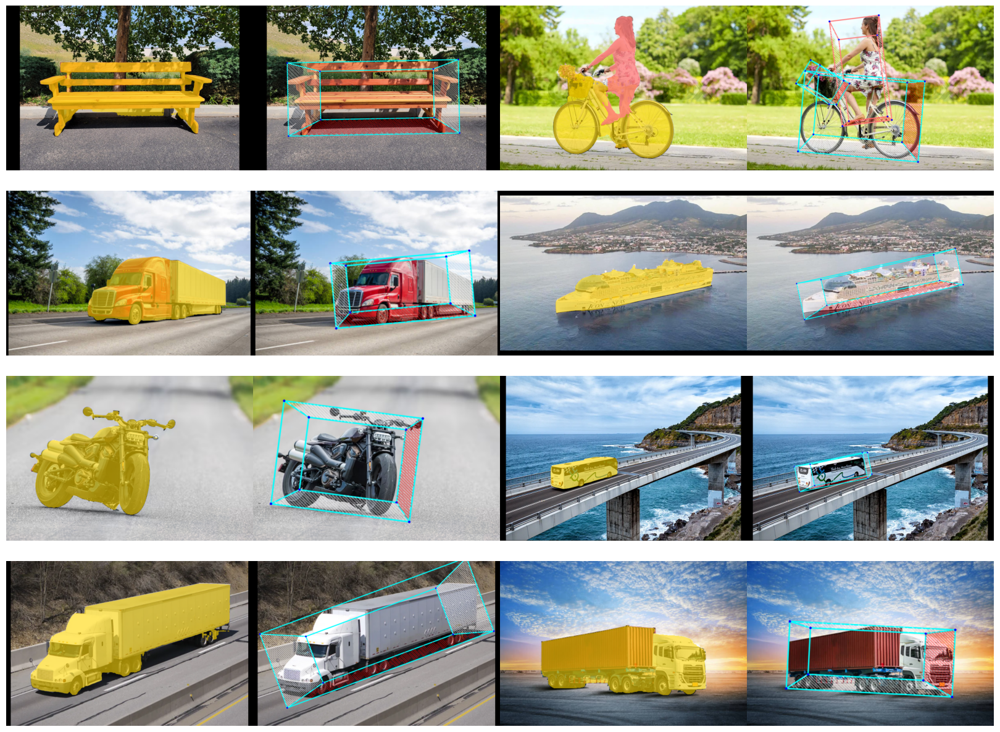

In [97]:
val_dir = "datasets/3d_tests"
num_samples = 8

all_imgs = [f for f in os.listdir(val_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_imgs = random.sample(all_imgs, min(num_samples, len(all_imgs)))
img_paths = [os.path.join(val_dir, fname) for fname in selected_imgs]

processed_imgs = []
img_sizes = []

for image_path in img_paths:
    # Load image
    image = Image.open(image_path).convert("RGB")

    inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = coco_model(**inputs)

    results = coco_image_processor.post_process_object_detection(
        outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.5
    )
    result = results[0]  # take first image results

    h, w = image.height, image.width

    # Camera intrinsics (simple guess)
    fx = fy = w
    cx, cy = w // 2, h // 2

    depth_out = depth_pipe(image_path)
    depth_map = np.array(depth_out["depth"], dtype=np.float32)
    depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

    # Resize to match original image size for bbox indexing
    depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)

    output_img = image.copy()
    output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)
    obb_img = output_img.copy()  # second image for rotated boxes

    # Get boxes and scores from DETR output
    boxes = result["boxes"]  # tensor [N, 4]
    scores = result["scores"]  # tensor [N]
    labels = result["labels"]  # tensor [N]

    # Run PyTorch NMS
    nms_threshold = 0.5  # IoU threshold
    keep_indices = nms(boxes, scores, nms_threshold)

    # Filter results
    boxes = boxes[keep_indices]
    scores = scores[keep_indices]
    labels = labels[keep_indices]

    boxes = boxes.cpu().numpy()
    labels = labels.cpu().numpy()
    scores = scores.cpu().numpy()

    for i, box in enumerate(boxes):
        x1 = max(0, min(w - 1, int(box[0])))
        y1 = max(0, min(h - 1, int(box[1])))
        x2 = max(0, min(w, int(box[2])))
        y2 = max(0, min(h, int(box[3])))

        if x2 <= x1 or y2 <= y1:
            print(f"Skipping invalid box {(x1, y1, x2, y2)}")
            continue

        class_id = labels[i]  # <-- this is the class ID
        #print(f"Processing box {(x1, y1, x2, y2)}, class_id: {class_id}")

        box_prompt = np.array([[x1, y1, x2, y2]])

        predictor.set_image(output_img)
        sam_masks, _, _ = predictor.predict(
            point_coords=None,
            point_labels=None,
            box=box_prompt,
            multimask_output=False,
        )

        sam_mask_binary = sam_masks[0].astype(np.uint8)

        if class_id == 5:
            # light red color
            mask_color = (127, 127, 255)
            alpha = 0.8  # transparency (0 = fully transparent, 1 = fully opaque)
        elif class_id == 1:
            # light red color
            mask_color = (127, 127, 255)
            alpha = 0.8  # transparency (0 = fully transparent, 1 = fully opaque)
            cubecolor = (127, 127, 255)
        else:
            mask_color = (0, 215, 255)  # BGR for gold
            alpha = 0.6  # transparency (0 = fully transparent, 1 = fully opaque)
            cubecolor = (255, 255, 0)

        overlay = output_img.copy()

        # Apply color to the masked area
        overlay[sam_mask_binary == 1] = mask_color

        # Blend overlay with original image
        output_img = cv2.addWeighted(overlay, alpha, output_img, 1 - alpha, 0)

        # ---------------- Robust rotated bounding box ----------------
        coords = np.column_stack(np.where(sam_mask_binary > 0))  # all mask points (y,x)

        if len(coords) > 0:
            # Swap to (x,y) for OpenCV
            coords_xy = coords[:, ::-1].astype(np.float32)

            # PCA to get main orientation
            mean, eigenvectors = cv2.PCACompute(coords_xy, mean=None)
            center = tuple(mean[0])
            angle = np.degrees(np.arctan2(eigenvectors[0,1], eigenvectors[0,0]))

            # minAreaRect on all points
            rect = cv2.minAreaRect(coords_xy)
            box_points = cv2.boxPoints(rect)
            box_points = np.int32(np.round(box_points))

            #print(f"Robust OBB Center: {rect[0]}, Size: {rect[1]}, Angle: {rect[2]}, PCA Angle: {angle}")

            if class_id == 5:
                # Draw OBB
                cv2.polylines(obb_img, [box_points], isClosed=True, color=(0,0,255), thickness=2)
            else:
                # 1) OBB mask
                obb_mask = np.zeros((h, w), dtype=np.uint8)
                cv2.fillPoly(obb_mask, [np.int32(box_points)], 1)

                # 2) Erode to keep only confident interior (avoid background at edges)
                kernel = np.ones((5, 5), np.uint8)
                obb_core = cv2.erode(obb_mask, kernel, iterations=1)
                if int(obb_core.sum()) < 50:  # fallback if object is small
                    obb_core = obb_mask

                vals = depth_map[obb_core == 1]
                if vals.size == 0:
                    print("Empty OBB depth region");
                    continue

                # 3) Decide if your map is inverse-depth-like
                g5, g95 = np.percentile(depth_map, (5, 95))
                med = float(np.median(vals))
                invert = abs(med - g5) < abs(med - g95)  # if closer to low end, treat low as NEAR

                def norm_to_depth_m(d, invert=False, z_near=1.0, z_far=50.0):
                    d = 1.0 - d if invert else d
                    return z_near + d * (z_far - z_near)

                Z_NEAR, Z_FAR = 1.0, 50.0  # tweak to taste

                # 4) Front-face depth (meters)
                obj_depth = norm_to_depth_m(med, invert, Z_NEAR, Z_FAR)
                obj_depth = max(obj_depth, Z_NEAR + 0.1)  # keep away from near plane

                # 5) OBB size in meters at that depth
                obb_w_px, obb_h_px = rect[1]
                box_width  = (obb_w_px / fx) * obj_depth
                box_height = (obb_h_px / fy) * obj_depth
                diag_m = max(1e-6, float(np.hypot(box_width, box_height)))

                # 6) Depth extent from robust spread, mapped to meters and CLAMPED
                spread_norm = float(np.percentile(vals, 90) - np.percentile(vals, 10))
                spread_m = (Z_FAR - Z_NEAR) * spread_norm  # same mapping range as above
                # Clamp depth to a reasonable fraction of in-plane size
                box_depth = float(np.clip(spread_m, 0.15 * diag_m, 0.6 * diag_m))

                # 7) Front face: project OBB corners at obj_depth
                front_corners = []
                for (px, py) in box_points:
                    Z = obj_depth
                    X = ((float(px) - cx) / fx) * Z
                    Y = ((float(py) - cy) / fy) * Z
                    front_corners.append((X, Y, Z))

                # --- Back face extrusion using 3D front corners (robust, stable) ---
                front_corners_np = np.array(front_corners)  # shape [4,3]

                # Compute 3D right direction along the longest edge of the front face
                edges_3d = [
                    front_corners_np[1] - front_corners_np[0],
                    front_corners_np[2] - front_corners_np[1],
                    front_corners_np[3] - front_corners_np[2],
                    front_corners_np[0] - front_corners_np[3]
                ]
                edge_lengths = [np.linalg.norm(e) for e in edges_3d]
                longest_edge_idx = np.argmax(edge_lengths)
                right_dir_3d = edges_3d[longest_edge_idx] / (edge_lengths[longest_edge_idx] + 1e-6)

                # Stable right-side extrusion: X/Y along longest edge, Z forward
                back_corners = []
                for fc in front_corners_np:
                    # Use unit right vector along longest edge
                    dx = right_dir_3d[0] * 0.5  # fixed in-plane offset in meters
                    dy = right_dir_3d[1] * 0.5
                    dz = box_depth             # forward along Z
                    back_corners.append((fc[0] + dx, fc[1] + dy, fc[2] + dz))

                # 9) Assemble + draw
                corners_3d = front_corners + back_corners

                # Order corners: top 4, bottom 4
                ordered = [corners_3d[i] for i in [0,1,2,3,4,5,6,7]]

                pts_2d = project_points(ordered, fx, fy, cx, cy)
                obb_img = draw_cube(obb_img, pts_2d, color=cubecolor, thickness=2)

                # Draw corner points (red dots)
                for (x, y) in pts_2d:
                    if x is not None and y is not None:
                        cv2.circle(obb_img, (x, y), 3, (255, 0, 0), -1)

                top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
                bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
                side_face_pts = [pts_2d[i] for i in [5,1,2,6]]
                leftside_face_pts = [pts_2d[i] for i in [0,4,7,3]]

                #obb_img = draw_slash_hatch_slanted(obb_img, top_face_pts, color=(0,0,255), spacing=5, thickness=2, direction=1, alpha=0.3)
                obb_img = draw_slash_hatch_slanted(obb_img, bottom_face_pts, color=(0,0,255), spacing=5, thickness=2, direction=-1, alpha=0.4)
                obb_img = draw_slash_hatch_slanted(obb_img, side_face_pts, color=(255,255,255), spacing=5, thickness=2, direction=-1, alpha=0.4)
                obb_img = draw_slash_hatch_slanted(obb_img, leftside_face_pts, color=(255,255,255), spacing=5, thickness=2, direction=-1, alpha=0.4)

    # Convert to RGB for matplotlib
    mask_display = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)
    obb_display = cv2.cvtColor(obb_img, cv2.COLOR_BGR2RGB)

    processed_imgs.append((mask_display, obb_display))
    img_sizes.append(output_img.shape[:2])  # (height, width)

cols = 4  # 2 images x 2 visuals = 4 subplots per row
rows = (len(processed_imgs) + 1) // 2  # 2 images per row

plt.figure(figsize=(4 * cols, 3 * rows))

# Target display size for each grid cell
target_height = 720
target_width = 1080

for idx, (img1, img2) in enumerate(processed_imgs):
    for view_idx, view in enumerate([img1, img2]):
        h, w = view.shape[:2]

        # Scale keeping aspect ratio
        scale = min(target_width / w, target_height / h)
        new_w, new_h = int(w * scale), int(h * scale)
        resized = cv2.resize(view, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

        # Pad to target size
        top = (target_height - new_h) // 2
        bottom = target_height - new_h - top
        left = (target_width - new_w) // 2
        right = target_width - new_w - left
        padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                    borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

        plot_idx = idx * 2 + view_idx + 1
        plt.subplot(rows, cols, plot_idx)
        plt.imshow(padded)
        plt.axis('off')

plt.tight_layout(pad=0)           # removes padding around the whole figure
plt.subplots_adjust(wspace=0, hspace=0)  # removes spacing between cells
plt.show()